# Comparative Analysis of Polarization Runs

In questo notebook confrontiamo in profondità cinque diverse configurazioni di analisi della polarizzazione, eseguite nelle cartelle `output/1` ... `output/5`. Per ogni confronto, commentiamo le principali osservazioni e implicazioni.

## 1. Estrazione dei dati
Per comodità importiamo direttamente lo zip contenente tutte le cartelle e lo estraiamo in runtime.

In [ ]:
import os, pickle
from IPython.display import display, Image, HTML
import pandas as pd

base = os.path.join(os.getcwd(),"output")
runs = {f'Run {d}': os.path.join(base, d) for d in sorted(os.listdir(base))}

## 2. Numero di cluster individuati
Calcoliamo quanti cluster distinti sono stati rilevati in ogni configurazione (escludendo -1, ovvero il rumore).

In [ ]:
summary = []
for name, path in runs.items():
    tfidf = os.path.join(path, 'cluster_labels_tfidf.pkl')
    emb = os.path.join(path, 'cluster_labels_emb.pkl')
    lbl_file = tfidf if os.path.exists(tfidf) else emb
    with open(lbl_file, 'rb') as f: labels = pickle.load(f)
    unique = set(labels.values())
    n_clusters = len(unique) - (1 if -1 in unique else 0)
    summary.append({'Run': name, 'Clusters': n_clusters, 'Method': 'TF-IDF' if lbl_file==tfidf else 'Embeddings'})
df_clusters = pd.DataFrame(summary)
display(df_clusters)

,Run,Clusters,Method
0,Run 1,133,TF-IDF
1,Run 2,17,TF-IDF
2,Run 3,15,TF-IDF
3,Run 4,16,Embeddings
4,Run 5,326,Embeddings


**Osservazioni**:
- **Run 1 (default TF-IDF + HDBSCAN)**: molteplici cluster (133), dovuti alla granularità elevata del vettorizzatore TF-IDF.
- **Run 2 (TF-IDF + LSA)**: riduzione drastica (17 cluster), LSA aggrega concetti simili.
- **Run 3 (TF-IDF + KMeans)**: esattamente 15 cluster, come richiesto dal parametro `--n-clusters`.
- **Run 4 (Embeddings)**: 16 cluster, similmente a TF-IDF, HDBSCAN individua gruppi tematici nel embedding space.
- **Run 5 (Embeddings + UMAP)**: 326 cluster, effetto di UMAP su riduzione dimensionale porta a spazi sparsi in cui HDBSCAN trova molti cluster.

## 3. Confronto visuale dei cluster
Mostriamo affiancate le rappresentazioni 2D (`clusters.png`) per valutare compattezza e separazione dei cluster.

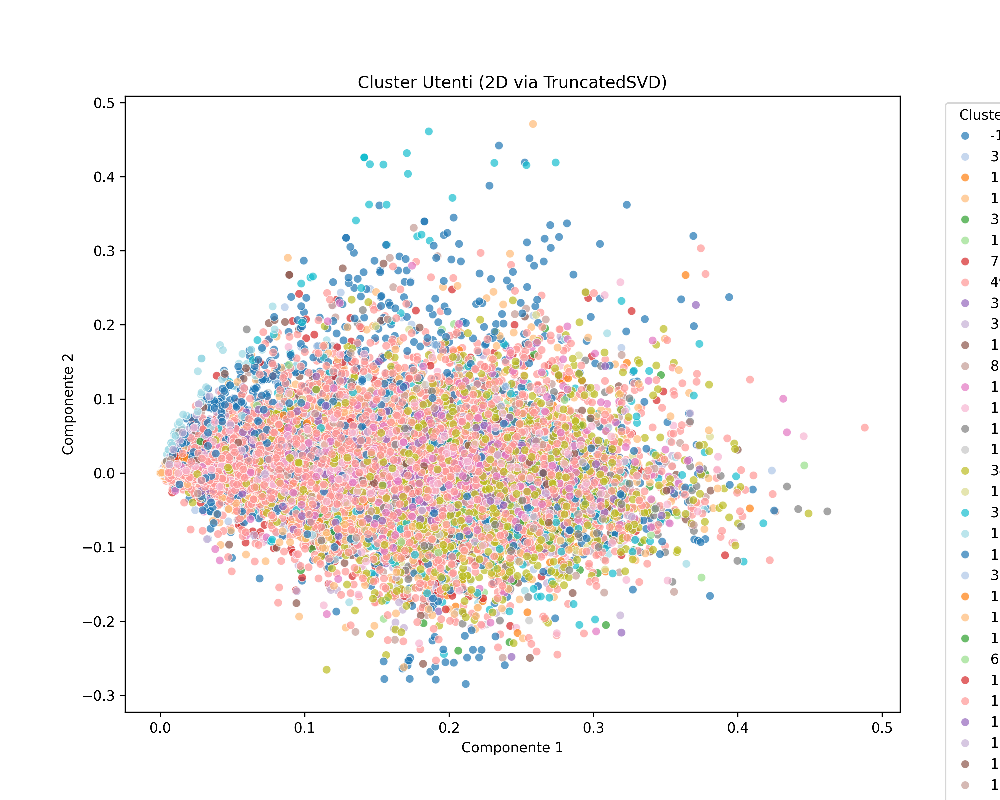

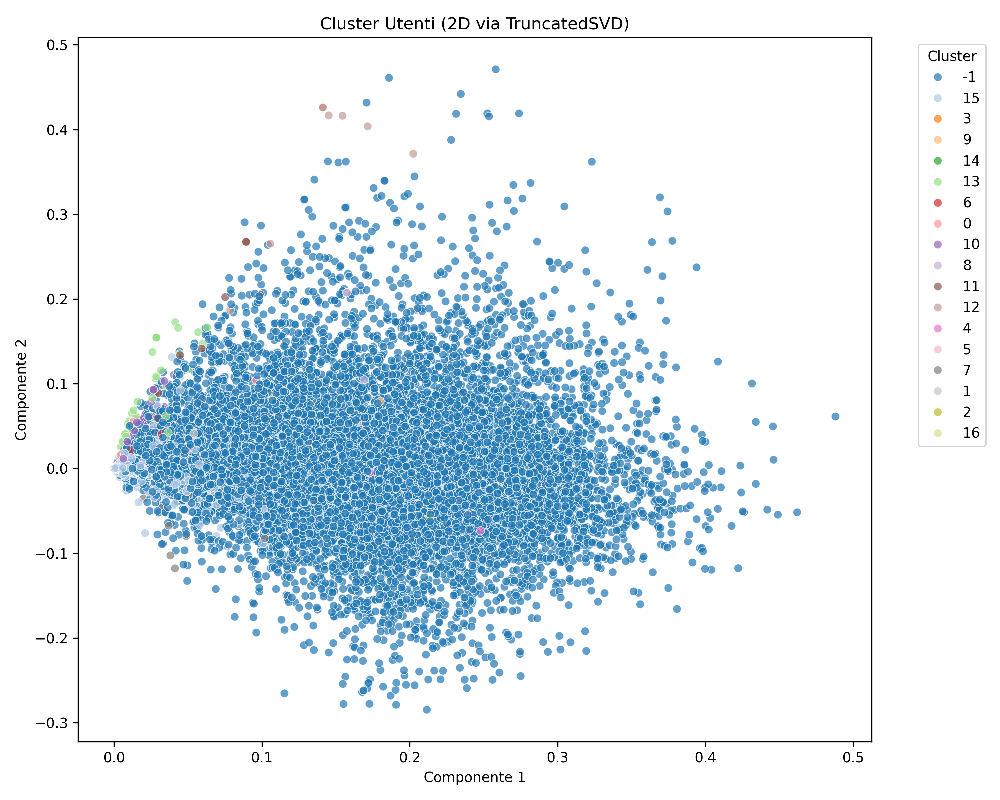

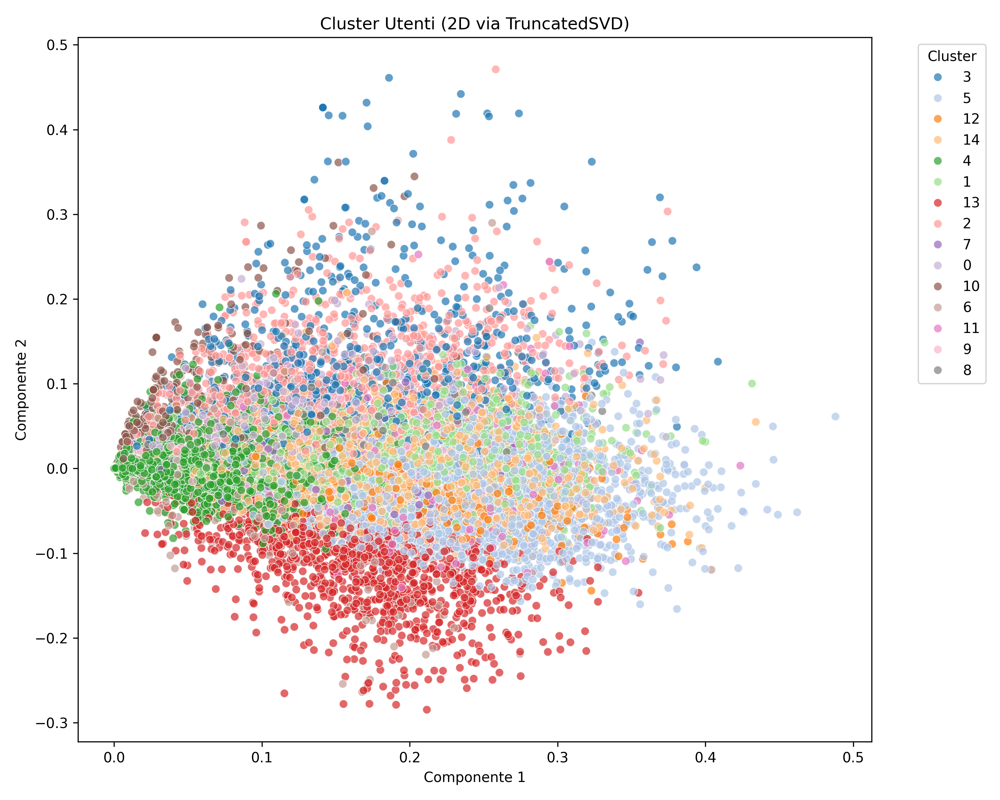

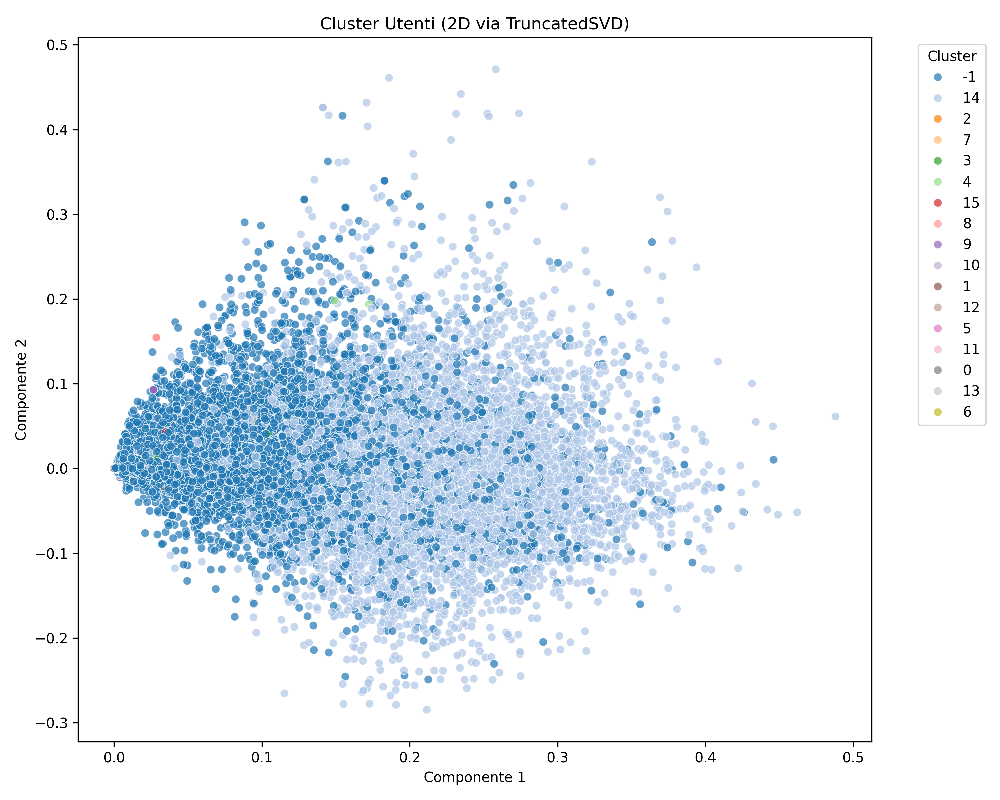

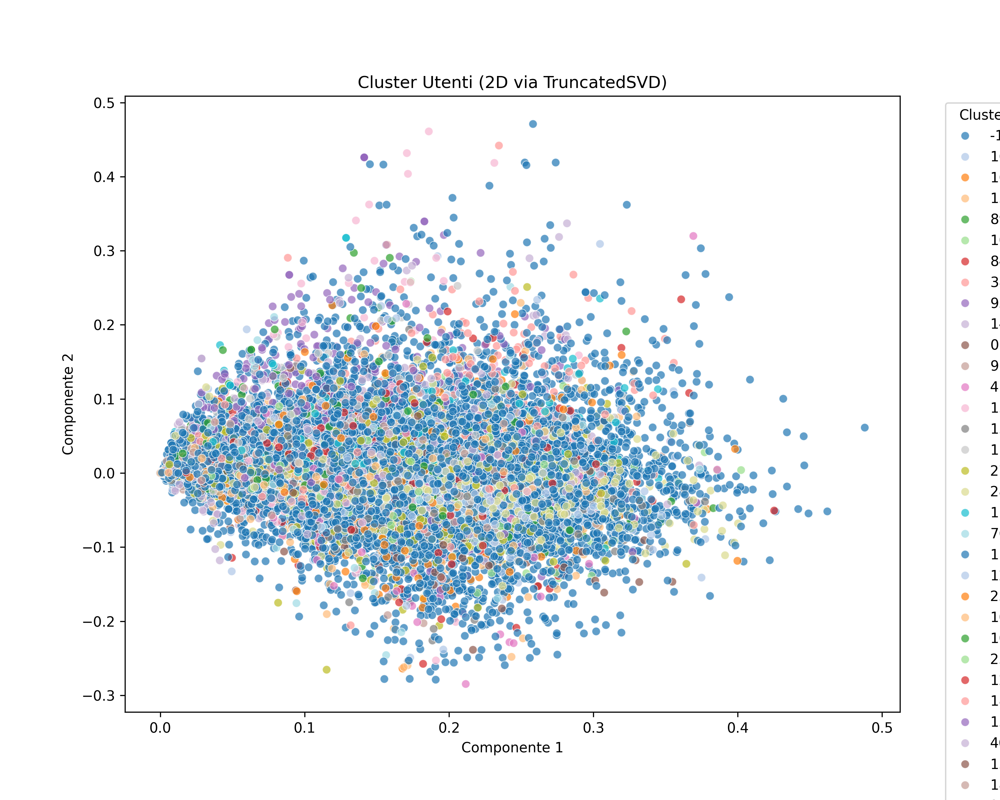

In [3]:
for name, path in runs.items():
    display(HTML(f'<h4>{name}</h4>'))
    display(Image(os.path.join(path, 'clusters.png'), width=900))

**Osservazioni**:
- **Run 1** mostra cluster molto frammentati.
- **Run 2** offre raggruppamenti più coesi, utile se si desidera un'overview più generale.
- **Run 3** (KMeans) tende a icasticamente suddividere in gruppi equisized, ma potrebbe mescolare concetti diversi.
- **Run 4 vs 5**: senza UMAP, gli embeddings mantengono forme più naturali; con UMAP, la proiezione eccessiva genera rumore.

## 4. Comparazione delle distribuzioni di sentimento
Visualizziamo i grafici `sentiment_bar_plot.png` per ogni run e discutiamo le differenze nei pattern di sentiment.

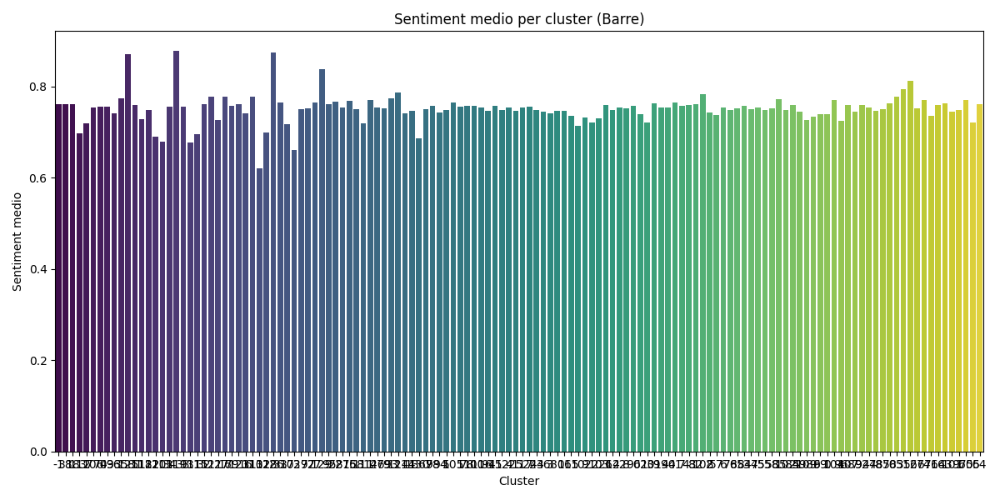

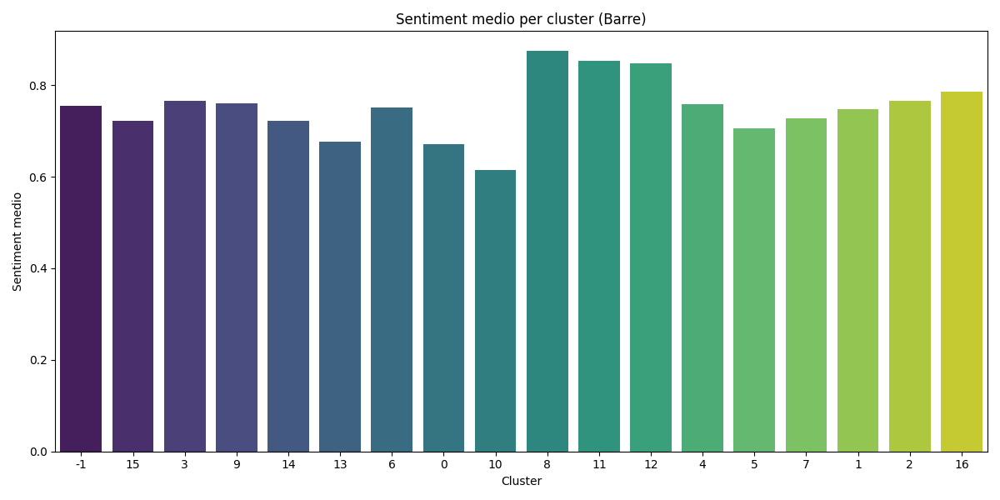

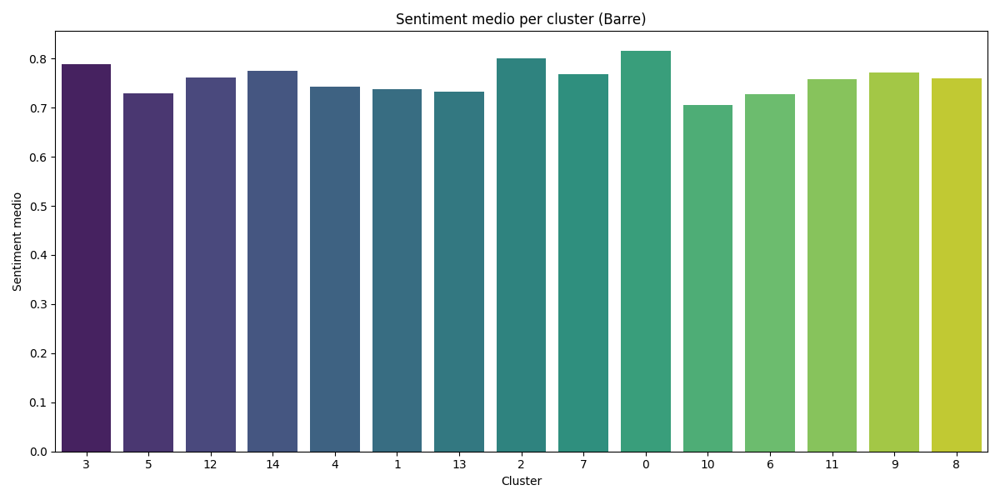

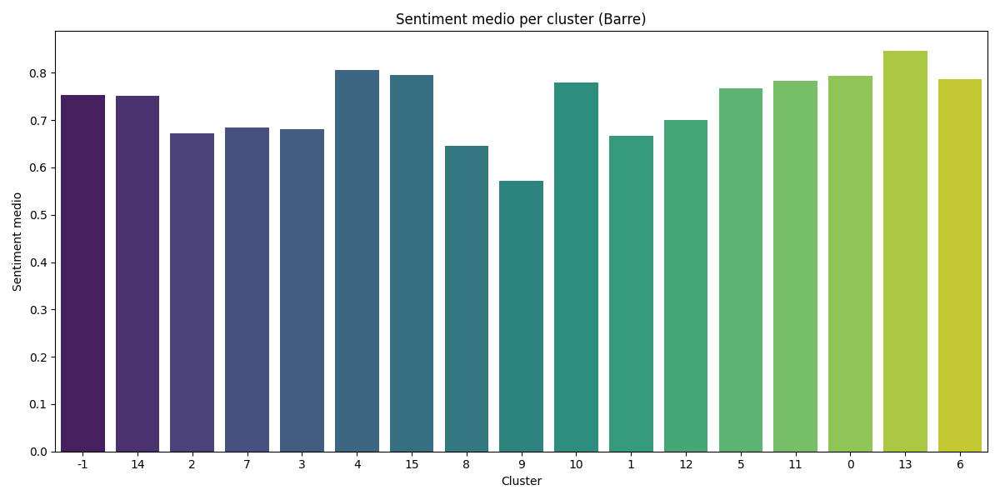

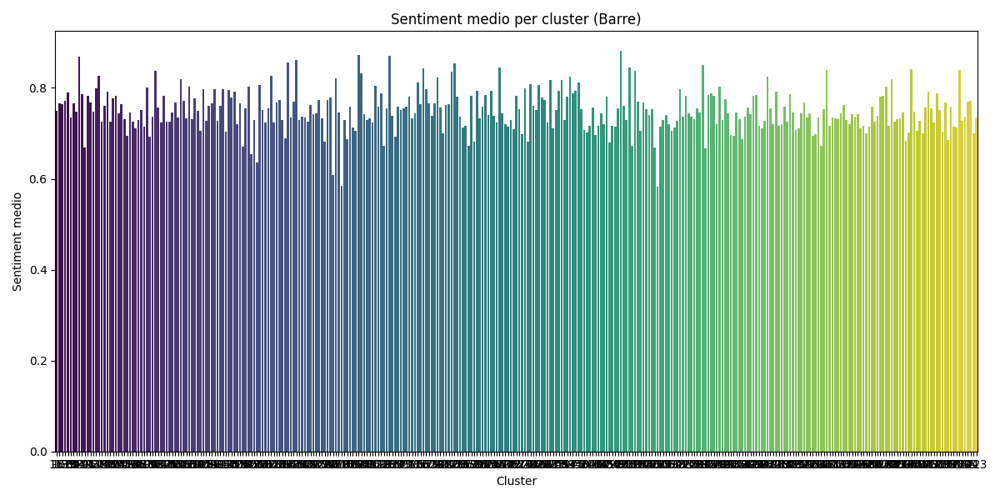

In [4]:
for name, path in runs.items():
    display(HTML(f'<h4>{name}</h4>'))
    display(Image(os.path.join(path, 'sentiment_bar_plot.png'), width=900))

**Osservazioni**:
- Le configurazioni con TF-IDF tendono a evidenziare cluster più polarizzati (picchi netti nel grafico).
- Con LSA (Run 2) la distribuzione dei sentiment appare più omogenea, meno estremi.
- Gli embeddings (Run 4 e 5) mostrano pattern simili a TF-IDF ma con leggere variazioni nei cluster rumorosi.

## 5. Temi polarizzanti (WordCloud)
Confrontiamo i wordcloud dei temi polarizzanti (unigrams e bigrams) per TF-IDF vs Embeddings.

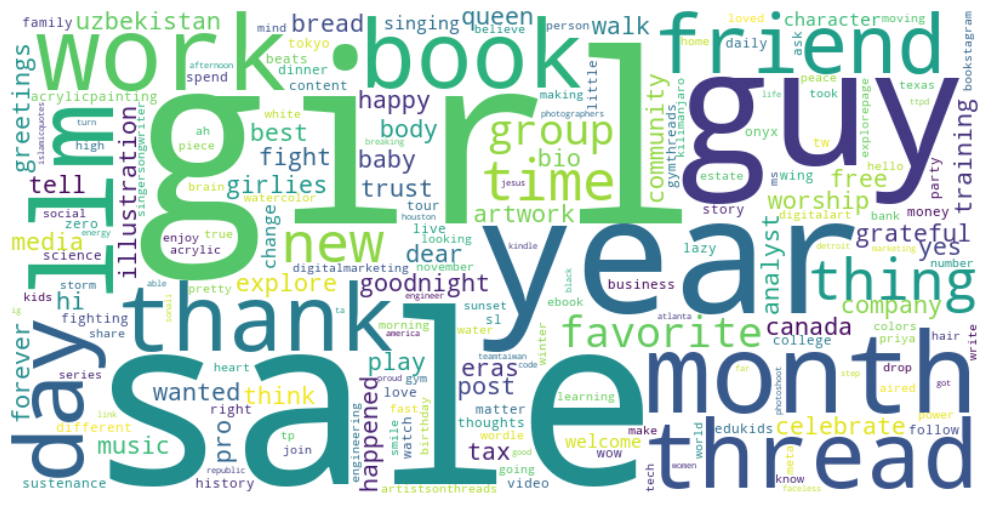

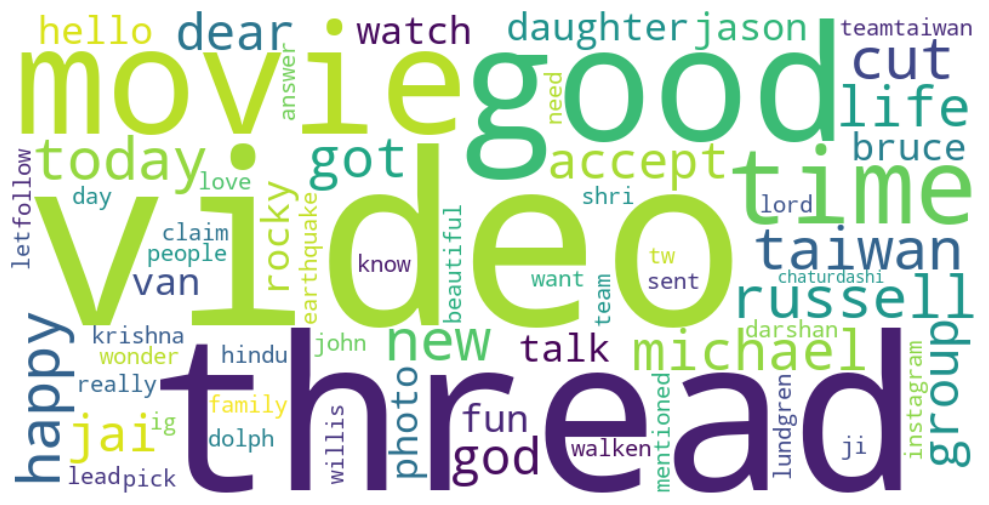

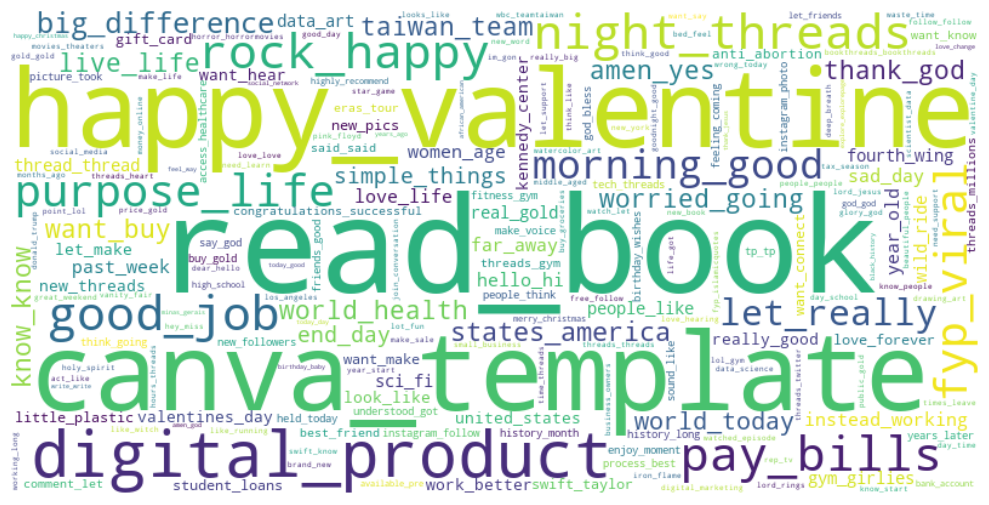

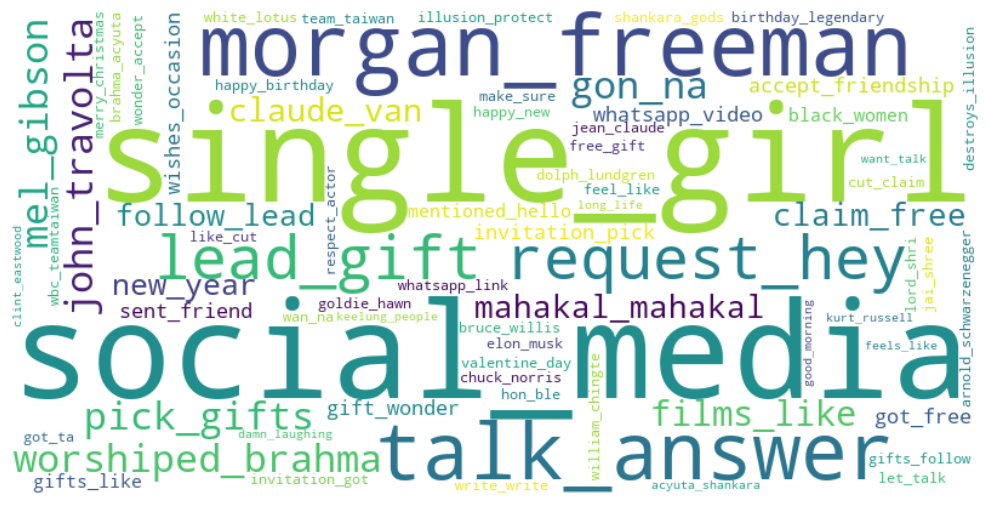

In [ ]:

display(HTML('<h5>Unigrams TF-IDF</h5>'))
display(Image(os.path.join(runs['Run 1'], 'polarizing_themes_TFIDF_Un.png'), width=900))
display(HTML('<h5>Unigrams Embeddings</h5>'))
display(Image(os.path.join(runs['Run 4'], 'polarizing_themes_EMB_Un.png'), width=900))

display(HTML('<h5>Bigrams TF-IDF</h5>'))
display(Image(os.path.join(runs['Run 1'], 'polarizing_themes_TFIDF_Bi.png'), width=900))
display(HTML('<h5>Bigrams Embeddings</h5>'))
display(Image(os.path.join(runs['Run 4'], 'polarizing_themes_EMB_Bi.png'), width=900))

**Osservazioni**:
- I wordcloud di TF-IDF mostrano keywords estremamente specifiche.
- Gli embeddings estraggono temi più semantici e generici.
- LSA (Run 2) riduce rumore nei temi polarizzanti, focalizzando parole principali.

## 6. Topic Modeling con LDA
Infine, confrontiamo le visualizzazioni LDA (`lda_visualization.html`) per ogni run.

**Nota**: apri `lda_visualization.html` nel browser per interattività. Di seguito uno screenshot esemplificativo di Run 1.

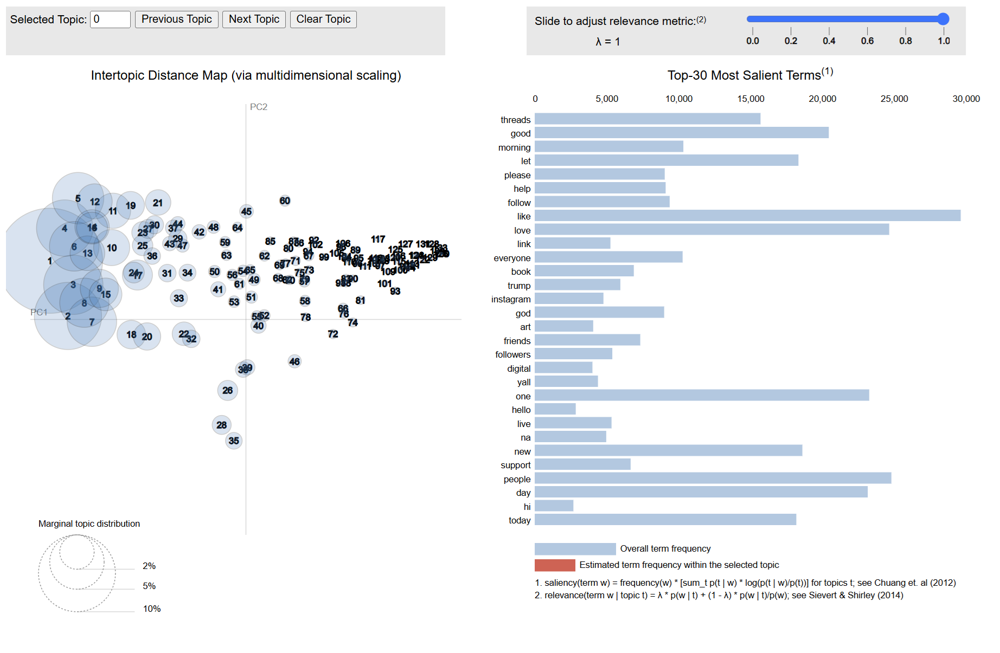

In [6]:
display(Image(os.path.join(runs['Run 1'], 'lda_visualization.html').replace('.html', '.png'), width=900)) 

**Conclusioni**:
- **TF-IDF senza LSA** evidenzia troppi cluster, utile per analisi fine-grained ma rumorosa.
- **TF-IDF + LSA** bilancia granularità e coesione, consigliato per overview.
- **KMeans** garantisce cluster di dimensioni comparabili ma meno naturali.
- **Embeddings** rilevano pattern semantici simili a TF-IDF; usare UMAP con cautela, può introdurre eccessiva frammentazione.

<!-- **Conclusioni**:
- **TF-IDF senza LSA** evidenzia troppi cluster, utile per analisi fine-grained ma rumorosa.
- **TF-IDF + LSA** bilancia granularità e coesione, consigliato per overview.
- **KMeans** garantisce cluster di dimensioni comparabili ma meno naturali.
- **Embeddings** rilevano pattern semantici simili a TF-IDF; usare UMAP con cautela, può introdurre eccessiva frammentazione. -->